# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: CARMEN AZORÍN MARTÍ


<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [1]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [2]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [3]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [4]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [5]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [6]:
import math

In [7]:
def GaussFunc(xaxis,sigma):
    f = lambda x: -(x*x)/(2*sigma*sigma)
    g = lambda x: math.exp(f(x))
    return list(map(g, xaxis))

def GaussDeriv1Func(xaxis,sigma):
    f = lambda x: -(x*x)/(2*sigma*sigma)
    derivf = lambda x: -x/(sigma*sigma)
    derivg = lambda x: math.exp(f(x))*derivf(x)
    return list(map(derivg,xaxis))

def GaussDeriv2Func(xaxis,sigma):
    f = lambda x: -(x*x)/(2*sigma*sigma)
    derivf2 = lambda x: x*x/(sigma*sigma*sigma*sigma)
    deriv2f = lambda x: -1/(sigma*sigma)
    deriv2g = lambda x: (deriv2f(x)+derivf2(x))*math.exp(f(x))
    return list(map(deriv2g,xaxis))

def findMink(sigma):
    k = 0
    # el bucle para cuando encuentre el primer entero k tal que k >= 3*sigma
    while 3*sigma > k:
      k = k+1
    return k

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana
    if order == 0:
      func = GaussFunc
    elif order == 1:
      func = GaussDeriv1Func
    elif order == 2:
      func = GaussDeriv2Func

    # calculamos k y el parámetro que falte: sigma o sizeMask
    if sigma != 0:
      k = findMink(sigma)
      sizeMask = 2*k+1
    else:
      k = (sizeMask-1)/2
      sigma = (sizeMask-1)/6
    # aplicamos la función correspondiente a todos los valores de [-k,...,k]
    mask = func(np.linspace(-k,k,sizeMask),sigma)

    if order == 0:
      # normalizamos
      sum = np.sum(mask)
      return list(map(lambda x: x/sum, mask))
    else:
      # escalamos
      return list(map(lambda x: x*sigma**order, mask))

In [8]:
def my2DConv(im, sigma, orders):
  maskG = np.array(gaussianMask1D(sigma,0,0))
  maskG1 = np.array(gaussianMask1D(sigma,0,1))
  maskG2 = np.array(gaussianMask1D(sigma,0,2))
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskG)
  elif orders==[0,1]:
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskG1)
  elif orders==[1,0]:
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG1,maskG)
  elif orders==[0,2]:
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG,maskG2)
  elif orders==[2,0]:
    return cv2.sepFilter2D(im,cv2.CV_64F,maskG2,maskG)
  else:
    print('error in order of derivative')

# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='blue'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='blue'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='blue'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='blue'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='blue'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='blue'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='blue'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='blue'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='blue'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='blue'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='blue'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='blue'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





La función _derivatives_ calcula las derivadas de la imagen en las direcciones x e y:
<center>$\dfrac{\partial I}{\partial x}, \dfrac{\partial I}{\partial y}$</center>

Las derivadas se usan para detectar cambios de intensidad de la imagen y servirán para calcular la SMM:

\begin{matrix}
A & B\\
B & C
\end{matrix}

Nota: Cada componente de la matriz H (SMM) tiene el mismo tamaño que el tamaño de la imagen de entrada. Es decir, cada píxel en la imagen de entrada tendrá asociados tres valores, ya que el valor B se repite.

La función _HarrisMap_ calcula el mapa de respuestas de Harris para cada píxel de la imagen:

<center>$A =\sum w(x,y) \partial I_x^2$</center>
<center>$B =\sum w(x,y) \partial I_x \partial I_y$</center>
<center>$C =\sum w(x,y) \partial I_y^2$</center>

Donde $w$ es la función ventana, para reducir el ruido y conseguir que las esquinas detectadas sean consistentes. La respuesta de Harris para cada píxel se calcula como:

<center>$HMap = \dfrac{A \cdot C - B^2}{A + C}$</center>

La matriz HMap ($f_H$) nos da un valor para cada píxel de la imagen.

In [9]:
# calcular las derivadas de las imágenes
def derivatives(im,sigmaD):
  dy = my2DConv(im,sigmaD,[0,1]) # Tamaño de dy:  (1200, 1600)
  dx = my2DConv(im,sigmaD,[1,0]) # Tamaño de dx:  (1200, 1600)
  return dx,dy

# calcular el mapa Harris
def HarrisMap(dx,dy,sigmaI):
  A = my2DConv(dx*dx,sigmaI,[0,0]) # Tamaño de A:  (1200, 1600)
  B = my2DConv(dx*dy,sigmaI,[0,0]) # Tamaño de B:  (1200, 1600)
  C = my2DConv(dy*dy,sigmaI,[0,0]) # Tamaño de C:  (1200, 1600)
  HMap = (A*C-B*B)/(A+C) # Tamaño de HMap:  (1200, 1600)
  return HMap

Una vez tenemos la matriz $f_H$, tenemos que eliminar las respuestas por debajo de un determinado umbral para obtener un número de Keypoints determinado (entre 450 y 500). Para ello usamos el método de supresión de no máximos.

Para este método podemos usar la funcion _corner_peaks_ que recibe la matriz $f_H$ como parámetro y elimina los puntos por debajo del umbral establecido. Además, los puntos no eliminados tienen una distancia mínima entre ellos también pasada como parámetro.

In [10]:
def NonMaximaSuppression(harrisMap, min_distance=5, threshold=0.01):
    # obtener las coordenadas de los picos
    coords = corner_peaks(harrisMap, min_distance=min_distance, threshold_rel=threshold)
    # extraer los valores del mapa de Harris en las coordenadas detectadas
    vectors = [(x, y, harrisMap[x, y]) for x, y in coords]
    return coords, vectors

Una vez nos tenemos los puntos de la imagen con los que nos queremos quedar (los keypoints): aquellos que tiene una información relevante sobre la imagen, calculamos su orientación en grados. La orientación indica hacia dónde apunta el cambio de intensidad más fuerte.

Para calcular la orientación de todos los píxeles de la imagen se crea la función _orientation_, donde se calcula $θ$:

<center>$θ = \dfrac{arctan(\dfrac{smooth(dy)}{smooth(dx)}) \cdot 180}{π}$</center>

Suavizamos la derivada en $x$ y en $y$ con un filtro Gaussiano de escala $\sigma = 3$, para asegurar que el cálculo de las orientaciones sea más robusto al ruido. Luego se usa la función $arctan2(I_y,I_x)$ para calcular el ángulo del gradiente en cada píxel. Este ángulo se convierte a radianes multiplicando por $180/ \pi$. Tenemos entonces que $θ$ es ua matriz del tamaño de la imagen de entrada (1200,1600).

Con la función _createKeyPoints_ creamos cada keypoint como una tupla de 4 elementos (coordenada x, coordenada y, orientación, tamaño). El tamaño se puede calcular como:

<center>$size=4 ⌊3σ_I⌋ +1$</center>

Este tamaño asegura que el keypoint tenga un diámetro suficientemente grande para ser visualizado.

In [11]:
# calcular el mapa de orientaciones
def orientation(dx,dy):
  sigma = 3
  Ix_smooth = my2DConv(dx,sigma,[0,0])
  Iy_smooth = my2DConv(dy,sigma,[0,0])
  theta = np.arctan2(Iy_smooth, Ix_smooth)*180.0/math.pi # Tamaño theta: (1200,1600)
  return theta

# calcular la lista de keypoints guardando localizacion, tamaño y orientación
def createKeyPoints(coords, orientations, sigmaI):
    keyPoints = []
    size = 4 * np.floor(3 * sigmaI) + 1  # calcula el tamaño del keypoint

    for i in range(len(coords)):
        x, y = 1.0*coords[i][1], 1.0*coords[i][0] # coordenadas
        angle = orientations[coords[i][0], coords[i][1]] # orientacion
        keyPoints.append(cv2.KeyPoint(x=x, y=y, size=size, angle=angle)) # guardamos la tupla

    return keyPoints


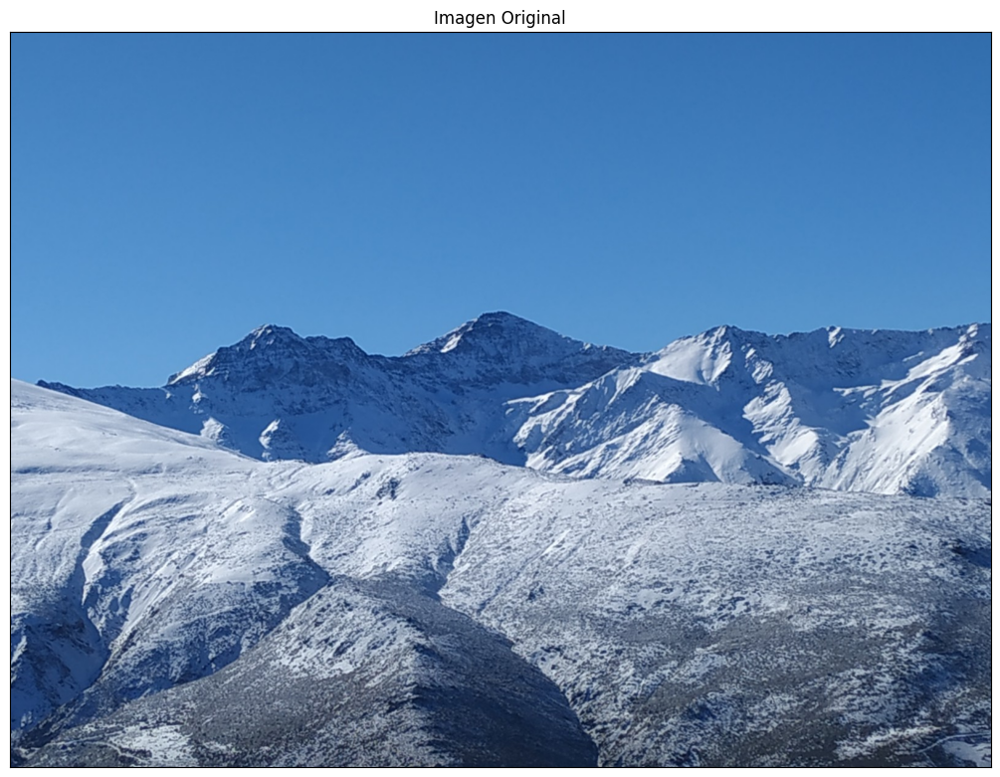

In [12]:
sigmaD = 1.5
sigmaI = 2.25
img = readIm(get_image('IMG_20220312_102944_S.jpg'),1)
displayIm(img,'Imagen Original',2)

Ahora vamos a aplicar el paso anterior a la supresión de no máximos. Vamos a caragr la imagen que se nos pide en el enunciado en escala de grises y calculamos las derivadas parciales de la imagen ($I_x, I_y$), que contienen las variaciones de intensidad en cada píxel de la imagen en las direcciones $x,y$.

Posterioremnte, calculamos el HarrisMap ($f_H$) a partir de la SMM, que asigna 3 valores a cada píxel de la imagen de entrada. A partie de las tres matrices, calcula el mapa de Harris suavizando con un filtro Gaussiano y aplicando el criterio en cada píxel.

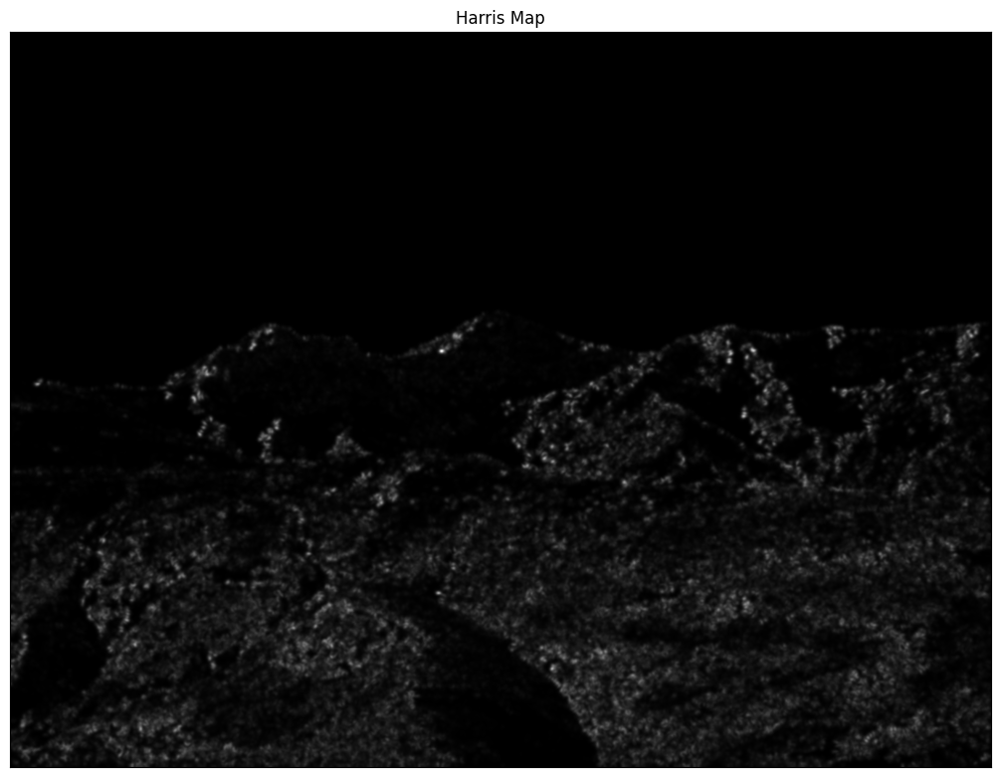

In [13]:
from skimage.feature import corner_peaks
img=readIm(get_image('IMG_20220312_102944_S.jpg'),0) # leemos la imagen en escala de grises
derivadas=derivatives(img,sigmaD) # calculamos las derivadas
harrisMap=HarrisMap(derivadas[0],derivadas[1],sigmaI) # calculamos el mapa Harris f_H
displayIm(harrisMap,'Harris Map', 2)

Ahora visualizamos los puntos detectado del mapa de Harris tras la supresión de no máximos (picos). Cada pico representa un posible keypoint. Además, el tamaño de cada punto se ajusta proporcionalmente a los valores asociados en el mapa de Harris para destacar su intensidad relativa.

La distancia mínima entre dos picos detectados para ser considerados independientes es 2 píxel, permite un control mínimo para evitar la superposición, pero conservando detalles en áreas donde hay muchas características pequeñas. El threshold es 0.3, lo que significa que sólo se conservan los picos que tienen un valor en $f_H$ superior a este umbral, es decir, se dejan los puntos que son al menos el 30% del valor máximo (1).

La cantidad de puntos detectados con estas restricciones es 460.

Number of keypoints detected:  460


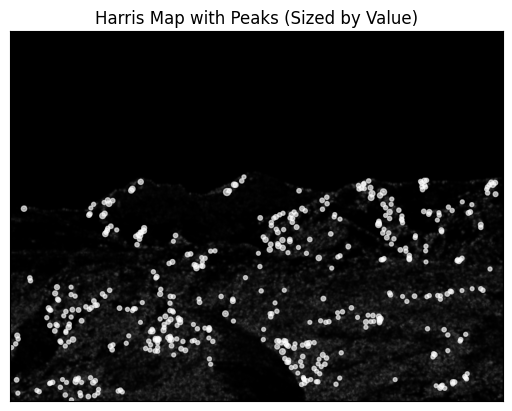

In [14]:
# visualizar los picos sobre el mapa de Harris
coords, vectors = NonMaximaSuppression(harrisMap, min_distance=2, threshold=0.3)
# mostrar el numero de coordenadas
print("Number of keypoints detected: ", len(coords))

if len(coords) == 0:
    print("No peaks detected.")
else:
    plt.imshow(harrisMap, cmap='gray')  # mostrar el mapa de Harris

    # extraer las coordenadas y los valores
    x_coords = [v[1] for v in vectors]  # Coordenadas en x
    y_coords = [v[0] for v in vectors]  # Coordenadas en y
    values = [v[2] for v in vectors]   # Valores asociados

    # normualizar los valores para que los tamaños sean manejables
    sizes = [100 * (v / max(values)) for v in values]

    # dibujar los puntos con tamaño proporcional al valor
    plt.scatter(x_coords, y_coords, c='w', s=sizes, marker='.', alpha=0.6)

    plt.title('Harris Map with Peaks (Sized by Value)')
    plt.xticks([]), plt.yticks([])  # sin numeración
    plt.show()


Ahora vamos a generar y visualizar los keypoints detectados en la imagen original.

Primero calculamos la orientación principal en cada punto basado en las derivadas calculadas anteriormente. Lo que devuelve una matriz 2D con la orientación calculada para cada píxel de la imagen.

Después, creamos una lista de keypoints (las esquinas detectadas) con los 4 valores necesarios para ser visualizados (coordenadas x, y, tamaño, orientación).

Finalmente, la imagen de salida se calcula con la función _drawKeypoints()_, que dibuja los keypoints detectados sobre la imagen original. La flag _cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS_ sirve para que los keypoints se dibujen con detalles ricos: el tamaño se representa con un círculo y la orientación como una línea dentro del círculo.

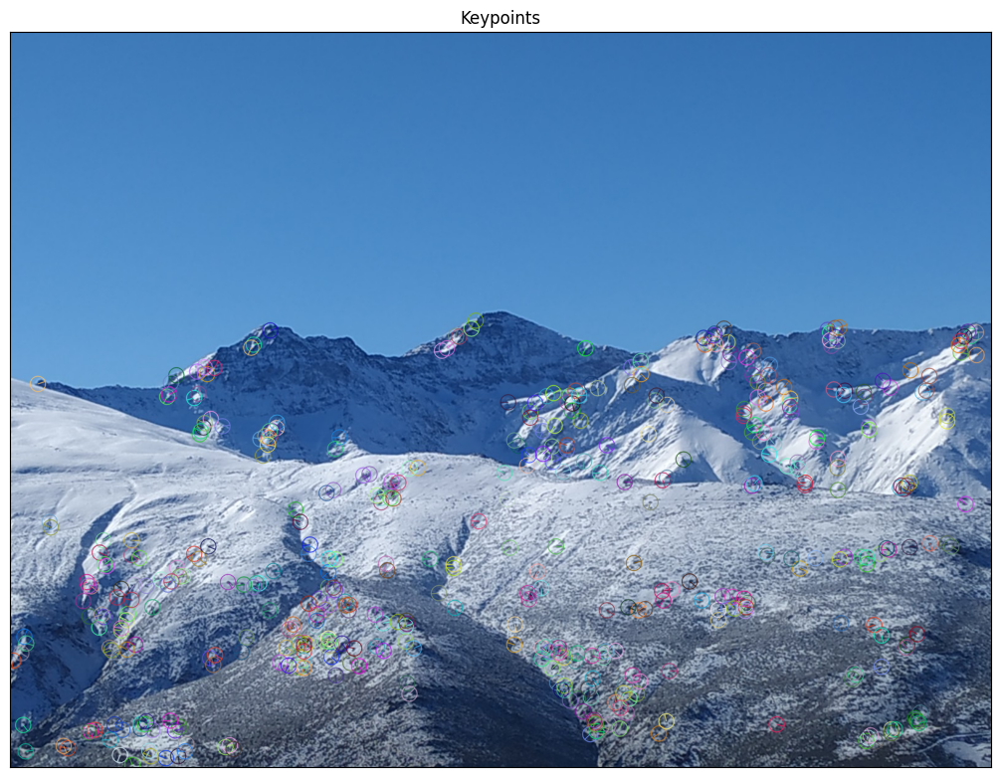

In [15]:
orientations = orientation(derivadas[0], derivadas[1])  # cálculo de orientaciones
keypoints = createKeyPoints(coords, orientations, sigmaI)  # crear keypoints
# dibujar los keypoints en la imagen original
output_image = cv2.drawKeypoints(
    readIm(get_image('IMG_20220312_102944_S.jpg'),1), # imagen de entrada a color
    keypoints,              # lista de keypoints
    None,                   # se genera automáticamente
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS # incluimos circulos y orientaciones en la visualización
)
displayIm(output_image,'Keypoints',2)


Vemos que los keypoints detectados se encuentran en zonas de mucho contraste de intensidades. En el cielo no hay ningún keypoint, ya que el cielo tiene un color uniforme y no presenta ninguna esquina que nos aporte información.

Por otro lado, las zonas donde empieza a hacer sombra las zonas donde nos encontramos el borde de la montaña sí que tienen muchos keypoints asociados, reflejando los cambios de intensidad más fuertes de la imagen.

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='blue'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='blue'>SIFT (Scale-invariant feature transform)

<font color='blue'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='blue'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

Esta función extrae keypoints y descriptores SIFT de una imagen.

Con la función _SIFT_create()_ creamos un objeto SIFT, indicando el número máximo de keypoints que se detectarán. La función _detectAndCompute()_ detecta keypoints en la imagen y calcula sus descriptores locales (vectores que describen la región alrededor del punto). Finalmente, se devuelven la lista de keypoints detectados (kp) y la matriz de descriptores (ds).

In [16]:
# Función para extraer puntos clave y descriptores usando SIFT
def siftPoints(im, nfeatures=5000):
    sift = cv2.SIFT_create(nfeatures=nfeatures)
    kp, ds = sift.detectAndCompute(im, None)
    return kp, ds

In OpenCV the output of a matching process is a vector of records. Each record provides information about the indexes of the matched KeyPoints and the distance between them.

A continuación, creamos distintas funciones.

La función _showKP(im, kp, title)_ visualiza los puntos clave detectados de la imagen de la misma forma que en el apartado anterior.

La función _showMatches()_ visualiza los emparejamientos entre los keypoints de dos imágenes. Recibe como parámetros ambas imágenes, ambas listas de keypoints, los matches y N el número de emparejamientos. Dibuja líneas contenado los keypoints emparejados y la flag _DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS_ sirve para no mostrar keypoints que no tengan emparejamiento.

La función _matching()_ calcula emparejamientos entre dos conjuntos de descriptores pasados como parámetros y según el método:
- BF (Brute Force) calcula las distancias euclidianas entre todos los pares de descriptores y los ordena por distancia ascendente. No aplica restricción de coherencia cruzada (Cross Check = False).
- BF + CC (Brute Force + Cross Check) sí aplica la restricción de coherencia cruzada, lo que asegura que guardamis el match si representa la distancia mínima desde la imagen A hasta la B y desde la imagen B hasta la A. Esto elimina las correspondencias inconsistentes.
- KNN (k-Nearest Neighbors) encuentra los dos descriptores más cercanos para cada descriptor de la primera imagen y calcula la distancia del mejor match partido de la distancia del segundo mejor match. Para que el match se considere poco ambiguo se usa un threshold de 0.75.

<center>$dist(m) < 0.75 dist(n)$</center>

Siendo $n$ y $m$ el mejor match y el segundo mejor match respectivamente.

In [17]:
# Función para mostrar keypoints en la imagen
def showKP(im, kp, title):
    img = cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    displayIm(img, title, 1)

# Función para mostrar los emparejamientos entre dos imágenes
def showMatches(im1, kp1, im2, kp2, matches, N, title='Matches'):
    img_matches = cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    displayIm(img_matches, title, 2)

# Función para calcular emparejamientos entre descriptores de dos imágenes
def matching(ds1, ds2, FlagMode='BF+CC'):
    if FlagMode == 'BF':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'BF+CC':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'KNN':
        bf = cv2.BFMatcher(cv2.NORM_L2)
        knn_matches = bf.knnMatch(ds1, ds2, k=2)
        good = []
        for m, n in knn_matches:
            if m.distance < 0.75 * n.distance:  # Test de Lowe
                good.append(m)
        return good
    else:
        print('Método de matching no válido')
        return []

In [18]:
numberOfmatches = 100

Como preprocesamiento de las imágenes, las escalamos al 50% de su tamaño original para reducir el tiempo de procesamiento. también las convertimos a escala de grises, para que SIFT extraiga características sin dependencia del color.

In [19]:
# preprocesamiento de las dos imágenes
img1=cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

A continuación detectamos los keypoints y sus desriptores para ambas imágenes con la función _siftPoints()_ y los visualizamos usando _showKP()_.

Y emparejamos los descriptores usando los tres métodos posibles de la función _metching()_.

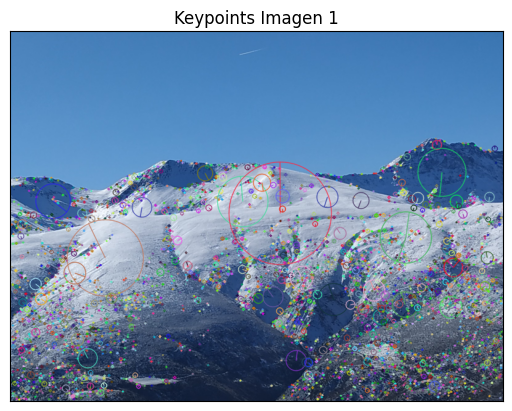

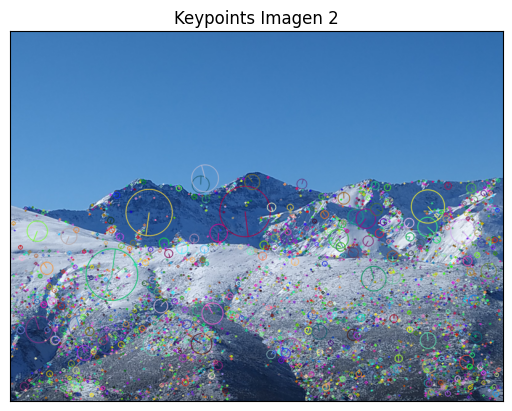

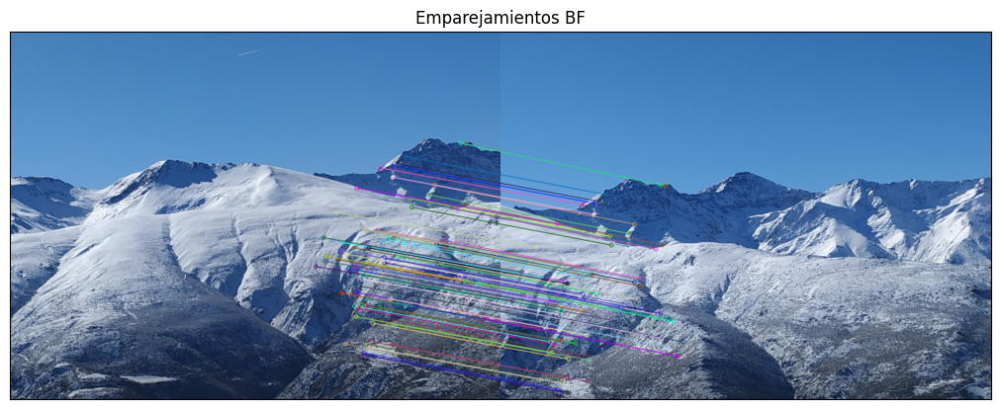

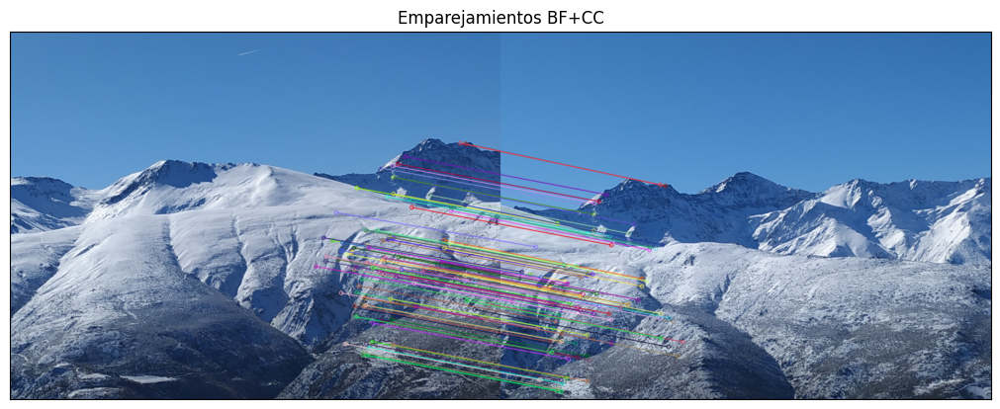

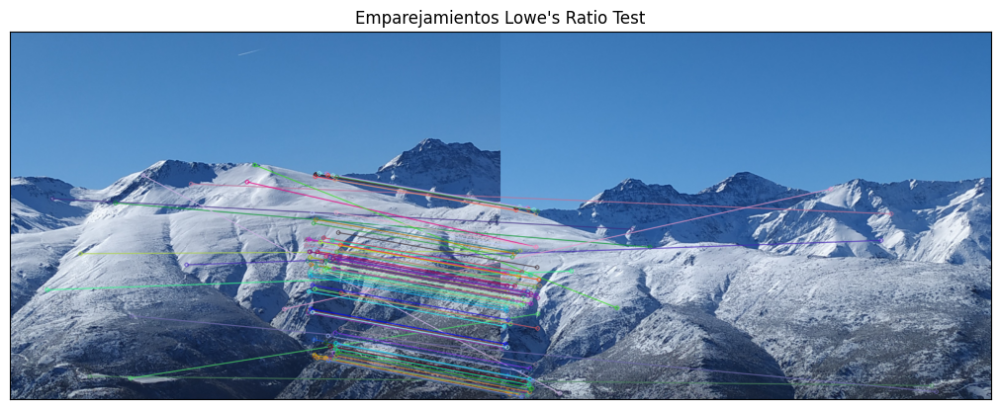

In [20]:
# Extracción de keypoints y descriptores usando SIFT
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Mostrar keypoints
showKP(img1, kp1, "Keypoints Imagen 1")
showKP(img2, kp2, "Keypoints Imagen 2")

# Emparejamientos usando Brute Force
matches_BF = matching(ds1, ds2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_BF, 100, "Emparejamientos BF")

# Emparejamientos usando Brute Force con Cross-Check
matches_BF_CC = matching(ds1, ds2, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_BF_CC, 100, "Emparejamientos BF+CC")

# Emparejamientos usando el Test de Lowe
matches_Lowe = matching(ds1, ds2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_Lowe, 100, "Emparejamientos Lowe's Ratio Test")

BF considera todos los descriptores posibles en ambas imágenes y selecciona siempre el más cercano, esto evita perder emparejamiento válidos por restricciones como el de Lowes Ratio Test. Aunque puede tener falsos positivos si no añadimos validación cruzada.

Si añadimos la validación cruzada, el emparejamiento debe ser consistente en ambos sentidos. En muchos casos, los emparejamientos más cercanos ya son consistentes y por eso los resultados de BF+CC son similares a los de BF. Sin embargo, BF+CC elimina falsos positivos causados por emparejamientos ambiguos.

KNN es el que peores resultados obtiene, probablemente debido a ser muy restrictivo y descartar buenos emparejamientos. Aunque en teoría, el KNN con Loews Ratio debería obtener el mejor resultado gracias a la reducción de falsos positivos en muchos casos.

## <font color='blue'>LBP (Local Binary Patterns)

<font color='blue'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='blue'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


In [21]:
!pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 33.7 MB/s eta 0:00:00


Para calcular los emparejamientos de keypoints entre dos imágenes usando LBP hemos creado dos funciones principales:

La función _computeLBP()_ calcula los descriptores LBP alrededor de los keypoints detectados por SIFT.

Para cada keypoint calculamos que la ventana centrada en él quede dentro de la imagen:

- x - half_window >= 0
- y - half_window >= 0
- x + half_window < im.shape[1]
- y + half_window < im.shape[0]

Las cuatro condiciones deben ser verdaderas para extraer la ventana centrada en el keypoint, que se guarda en la variable _patch_. Para esta ventana se calcula el vector de características LBP: el radio indica la distancia desde el pixel central hacia los puntos periféricos y los points indica cuántos puntos se evalúan alrededor del píxel central. Finalmente, se devuelve el array de descriptores en tipo float32 para usarlo en el emparejamiento.

La función _matchingLBP()_ empareja descriptores entre dos imágenes según el modo indicado, igual que para SIFT.

Para aplciarlo a las imágenes anteriores ya preprocesadas, extraemos los keypoints con SIFT y calculamos los descriptores con la función _computeLBP()_. Después aplicamos los 3 métodos distintos para encontrar los emparejamientos llamando a _matchingLBP()_.

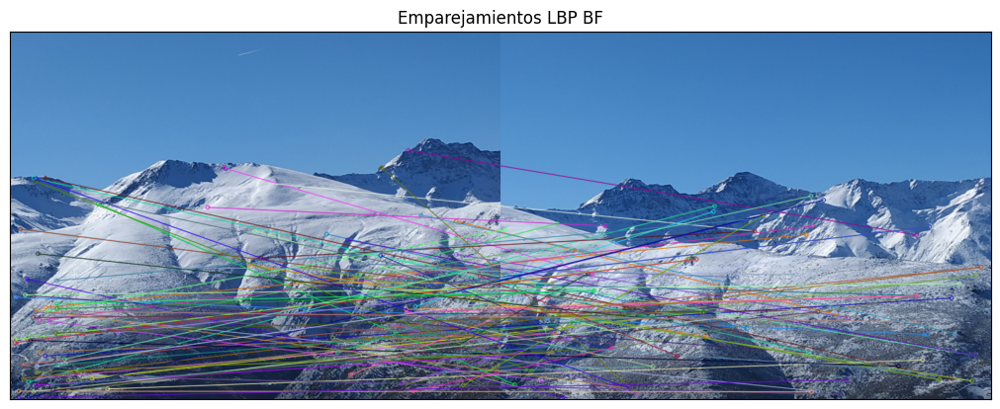

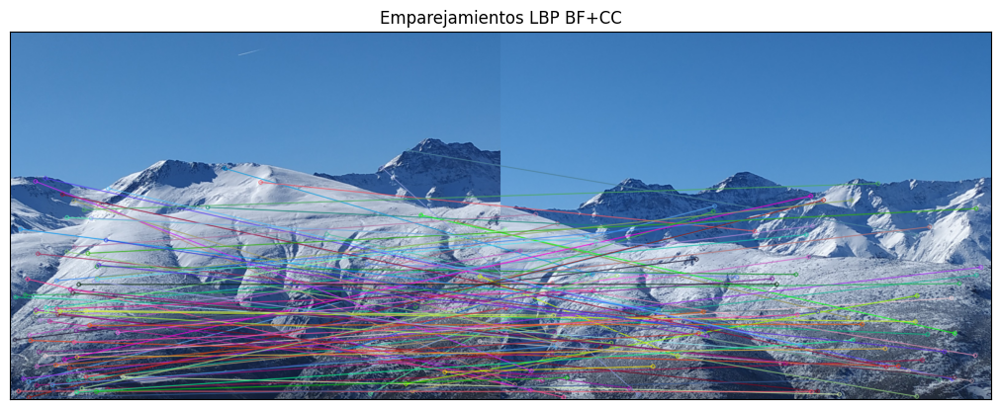

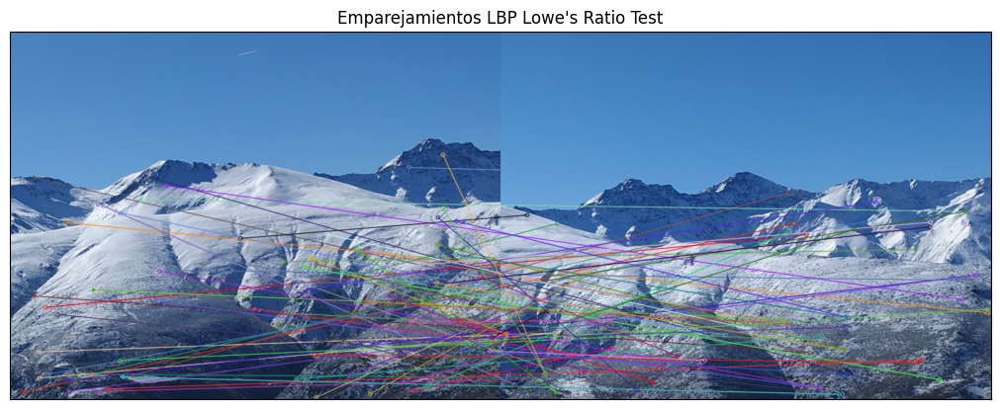

In [31]:
import cv2
import numpy as np
import mahotas
from skimage.feature import local_binary_pattern

# Función para calcular descriptores LBP en torno a keypoints SIFT
def computeLBP(im, kp, radius=1, points=8, window_size=7):
    descriptors = []
    half_window = window_size // 2
    for point in kp:
        x, y = int(point.pt[0]), int(point.pt[1])  # Coordenadas del keypoint
        # Extraer una ventana centrada en el keypoint
        if (x - half_window >= 0 and y - half_window >= 0 and
            x + half_window < im.shape[1] and y + half_window < im.shape[0]):
            patch = im[y - half_window:y + half_window + 1, x - half_window:x + half_window + 1]
            # Calcular LBP en el parche usando mahotas
            lbp = mahotas.features.lbp(patch, radius, points)
            # print("tamaño lbp", len(lbp))
            descriptors.append(lbp)
    return np.array(descriptors, dtype="float32")

# Función para emparejar descriptores LBP
def matchingLBP(ds1, ds2, FlagMode='BF'):
    if FlagMode == 'BF':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'BF+CC':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'KNN':
        bf = cv2.BFMatcher(cv2.NORM_L2)
        knn_matches = bf.knnMatch(ds1, ds2, k=2)
        good = []
        for m, n in knn_matches:
            if m.distance < 0.75 * n.distance:  # Test de Lowe
                good.append(m)
        return good
    else:
        print('Método de matching no válido')
        return []

# Extracción de keypoints usando SIFT
kp1, _ = siftPoints(im1)
kp2, _ = siftPoints(im2)

# Calcular descriptores LBP en torno a los keypoints
ds1_LBP = computeLBP(im1, kp1)
ds2_LBP = computeLBP(im2, kp2)

# Emparejamientos usando Brute Force
matches_LBP_BF = matchingLBP(ds1_LBP, ds2_LBP, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_LBP_BF, 100, "Emparejamientos LBP BF")

# Emparejamientos usando Brute Force con Cross-Check
matches_LBP_BF_CC = matchingLBP(ds1_LBP, ds2_LBP, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_LBP_BF_CC, 100, "Emparejamientos LBP BF+CC")

# Emparejamientos usando el Test de Lowe
matches_LBP_Lowe = matchingLBP(ds1_LBP, ds2_LBP, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_LBP_Lowe, 100, "Emparejamientos LBP Lowe's Ratio Test")


**Tamaño esperado**

Usamos radio de 1 pixel y 8 puntos alrededor del pixel central, luego tenemos que guardar 8 bits. El número total de combinaciones de 8 bits es $2^8=256$, por tanto el tamaño teórico del vector LBP es de 256 elementos.

Sin embargo, si descomentamos la orden _print("tamaño lbp", len(lbp))_ nos indica un tamaño de 36. Según se nos idnica en esta página [researchGate](https://www.researchgate.net/publication/221303862_Gray_Scale_and_Rotation_Invariant_Texture_Classification_with_Local_Binary_Patterns), se utiliza una variante de LBP conocida como LBP rotacionalmente invariante uniforme en dos transiciones.

Esta versión considera que hay 36 patrones binarios únicos invariantes de la rotación que pueden aparecer entre los vecinos de ocho píxeles. Podemos dividir los patrones segñun la cantidad de 1s presentes en el círculo de 8 píxeles. Esto da lugar a un único patrón uniforme para cada cantidad de 1s:
- para 0 '1s': 00000000
- para 1 '1s': 10000000
- para 2 '1s': 11000000
- ...

En total hay 9 posibles cantidades de '1s' (0 a 8) y, por tanto, 9 patrones uniformes (que tienen como máximo dos cambios de 1s a 0s o viceversa).

Además, hay 3x9 patrones invariantes no uniformes. Por ejemplo:
- 10100000 != 10010000
- 10100000 == 00101000

En la imagen del enlace mencionado aparecen todas las posibles combinaciones. Esto resulta en $3 \cdot 9 + 9=36$ patrones invariantes.

Este enfoque reduce el número de patrones posibles generando un descriptor más compacto y fácil de procesar. Aunque puede resultar en la pérdida de detalles clave para el emparejamiento de descriptores: al tener menos patrones únicos, el descriptor es menos discriminativo y lleva a emparejamientos menos precisos.

El algoritmo LBP es un descriptor bastante simple que sirve para capturar características locales. Aunque es rápido y eficiente, los resultados son poco fiables.

Cuando usamos BF el número de falsos positivos aumenta considerablemente, ya que con LBP los descriptores son menos únicos cuando las regiones tienen poca textura, como es el caso de la montaña o el cielo. Si añadimos Cross-Check se eliminan algunos falsos positivos, pero siguen quedando demasiados, ya que los descriptores siguen sin ser demasiado distintivos.

Este problema también afecta al KNN, ya que al tener descriptores similares, las distancias entre el mejor y el segundo mejor emparejamiento son similares. Esto resulta en que no se cumpla el criterio de distancia en muchos emparejamiento, y por eso este algoritmo genera pocos emparejamientos comparados con los anteriores.

## <font color='blue'>HOG (Histogram of oriented gradients)

<font color='blue'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

La función _computeHOG_ calcula los descriptores HOG en torno a los keypoints pasados como parámetro. Para hacerlo, calcula la ventana del tamaño 7x7 alrededor de cada keypoint (asegurándose de que la ventana quede dentro de la imagen). Y posteriormente redimensiona la ventana al tamaño estándar de HOG (64x128 píxeles). COn la función _hog_ calcula las características HOG con los parámetros del enunciado.

Igual que en los apartados anteriores, se calculan los emparejamientos usando la función _matchingHOG_ y dependiendo del método especificado.

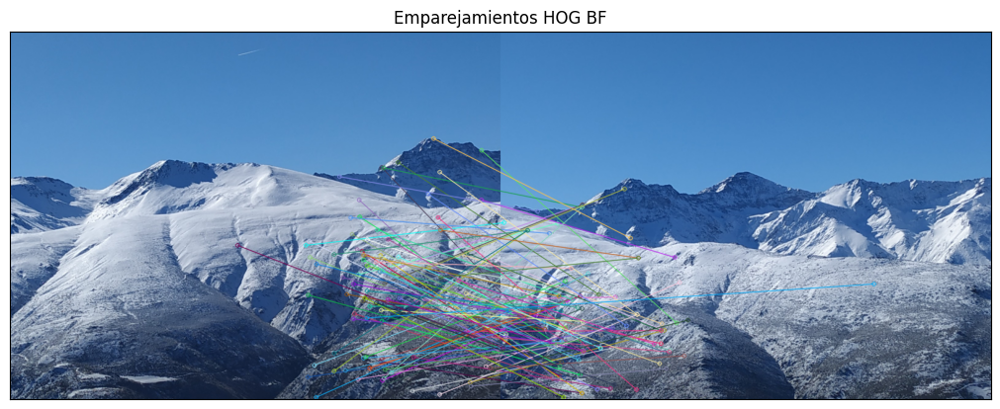

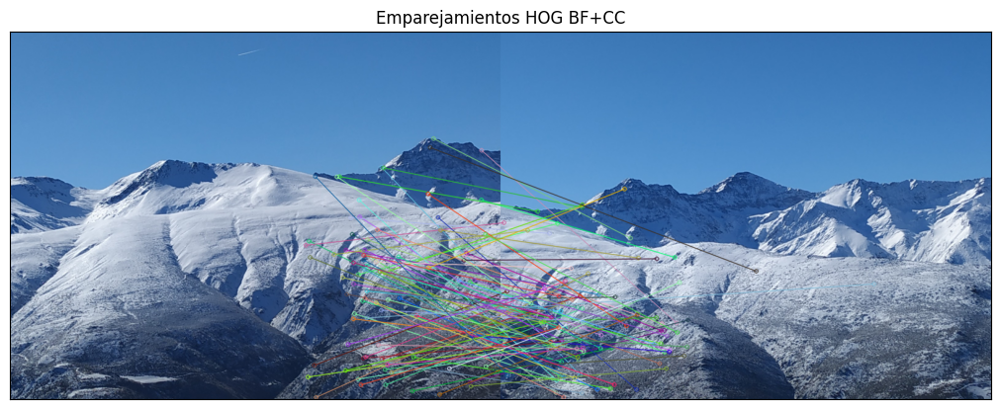

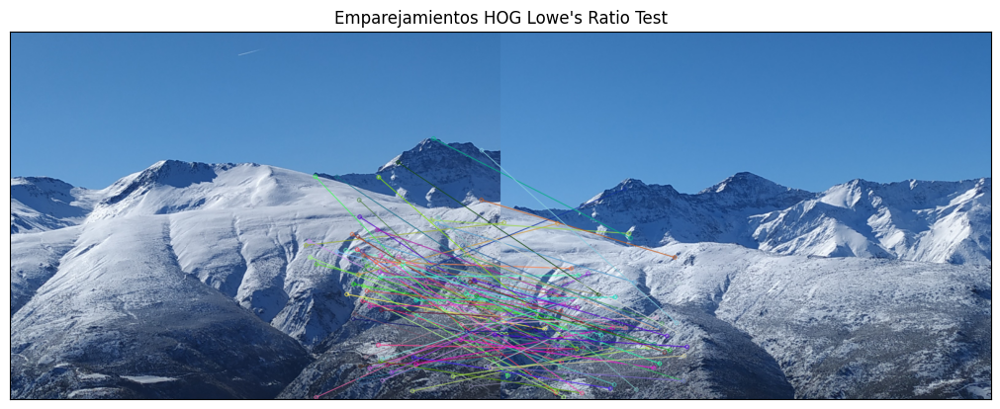

In [23]:
from skimage.feature import hog
from skimage.transform import resize

# Función para calcular descriptores HOG en torno a keypoints SIFT
def computeHOG(im, kp, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), window_size=7):
    descriptors = []
    half_window = window_size // 2
    for point in kp:
        x, y = int(point.pt[0]), int(point.pt[1])  # Coordenadas del keypoint
        # Extraer una ventana centrada en el keypoint
        if (x - half_window >= 0 and y - half_window >= 0 and
            x + half_window < im.shape[1] and y + half_window < im.shape[0]):
            patch = im[y - half_window:y + half_window + 1, x - half_window:x + half_window + 1]
            # Redimensionar el parche al tamaño estándar de HOG: 64x128
            patch_resized = resize(patch, (128, 64), anti_aliasing=True)
            # Calcular características HOG
            hog_features = hog(
                patch_resized,
                orientations=orientations,
                pixels_per_cell=pixels_per_cell,
                cells_per_block=cells_per_block,
                block_norm="L2-Hys",
                feature_vector=True
            )
            descriptors.append(hog_features)
    return np.array(descriptors, dtype="float32")  # Garantizamos float32

# Función de emparejamiento HOG (similar a LBP)
def matchingHOG(ds1, ds2, FlagMode='BF'):
    if FlagMode == 'BF':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'BF+CC':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(ds1, ds2)
        matches = sorted(matches, key=lambda x: x.distance)
        return matches
    elif FlagMode == 'KNN':
        bf = cv2.BFMatcher(cv2.NORM_L2)
        knn_matches = bf.knnMatch(ds1, ds2, k=2)
        good = []
        for m, n in knn_matches:
            if m.distance < 0.75 * n.distance:  # Test de Lowe
                good.append(m)
        return good
    else:
        print('Método de matching no válido')
        return []

# Extracción de keypoints usando SIFT
kp1, _ = siftPoints(im1)
kp2, _ = siftPoints(im2)

# Calcular descriptores HOG en torno a los keypoints
ds1_HOG = computeHOG(im1, kp1)
ds2_HOG = computeHOG(im2, kp2)

# Emparejamientos usando Brute Force
matches_HOG_BF = matchingHOG(ds1_HOG, ds2_HOG, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_HOG_BF, 100, "Emparejamientos HOG BF")

# Emparejamientos usando Brute Force con Cross-Check
matches_HOG_BF_CC = matchingHOG(ds1_HOG, ds2_HOG, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_HOG_BF_CC, 100, "Emparejamientos HOG BF+CC")

# Emparejamientos usando el Test de Lowe
matches_HOG_Lowe = matchingHOG(ds1_HOG, ds2_HOG, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_HOG_Lowe, 100, "Emparejamientos HOG Lowe's Ratio Test")


Para calcular la dimensionalidad del vector de característcias tenemos que:
- El número de celdas en la dirección horizontal son $64/8=8$ celdas y en la dirección vertical $128/8=16$ celdas. En total, $8 \cdot 16 = 128$ celdas.
- El número de bloques en la dirección horizontal son $8-2+1=7$ bloques y en la dirección vertical $16-2+1=15$ bloques. En total, $7 \cdot 15=105$ bloques.
- Cada bloque es de $2 \cdot 2=4$ celdas y cada celda tiene valores para 9 orientaciones. Luego, cada bloque $4 \cdot 9=36$
- Dimensionalidad total $= 105 \cdot 36 = 3780$


<font color='blue'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

Podemos decir sin ninguna duda que los mejores emparejamientos resultan al aplicar SIFT. Además, con cualquiera de los tres métodos da mejores resultados que LBP y HOG. SIFT genera descriptores muy distintivos, gracias al histograma de gradientes orientados en regiones locales alrededor de cada keypoint. Estos descriptores son robustos frente a variaciones de iluminación, ruido y pequeños cambios de perspectiva.

Por otro lado, los descriptores de LBP son menos distintivos, porque se tratan de patrones binarios locales, que no generan información detallada sobre cómo se distribuyen las intensidades alrededor del keypoint. Esto los hace muy sensibles a cambios de iluminación y poco efectivos para distinguir entre características similares.

En el caso de HOG, que usa histogramas como SIFT, la ventana es fija y no se adapta a cada keypoint, lo que limita que cada descriptor sea único y distintivo.

En este caso no es demasiado importante, ya que la escala y la rotación es la misma en ambas imágenes, pero SIFT es el único descriptor invariante a estas trasnformaciones, mientras que LBP y HOG no lo son. Esto convierte a SIFT en un descriptor más eficaz que los otros en aplicaciones más generales.

# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='blue'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

Esta función calcula la matriz de homografía que transforma punto de una imagen (kp1) a otra imagen (kp2). La homografía eprmite trasformar un punto $(x,y)$ de la primera imagen a un punto $(x',y')$ en la segunda imagen mediante la fórmula:

<center>$[x', y', w]^T=H \cdot [x, y, 1]^T$</center>

donde H es la matriz 3x3 calculada por la función _findHomography_ y las coordenadas finales se obtienen normalizando por $w$: $x
′
 =x
′
 /w,
𝑦
′
=
𝑦
′
/
𝑤
y
′
 =y
′
 /w$

 El método RANSAC (Random Sample Consensus) se emplea para ajustar el modelo eliminando los posibles outliers, es decir, puntos emparejados incorrectamente. Ransac_Error determina si un punto es un inlier o un outlier.

In [24]:
# Función para calcular la homografía
def homography(kp1, kp2, matches, Ransac_Error=5.0, MIN_MATCH_COUNT=20):
    if len(matches) > MIN_MATCH_COUNT:
        # extraer las coordenadas de los puntos emparejados
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # calcular la homografía usando RANSAC
        H, status = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, Ransac_Error)
        return H, status
    else:
        print('Error: pocos matches')
        return None, None

<font color='blue'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='blue'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='blue'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='blue'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='blue'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='blue'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='blue'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='blue'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='blue'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='blue'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


La función _computeLocalHomographies_ calcula homografías entre pares cosecutivos de imágenes (llamando a la función _homography_). Esta función utiliza SIFT para detectar los keypoints y calcular sus descriptores. Para calcular los emparejamientos de los keypoints se puede usar el método KNN o BF. Finalmente, con la función _homography_ explicada anteriormente, se calcula la matriz de homografía entre las imágenes. De forma que nos devuelve 10 matrices si tenemos 11 imágenes:
$[H01,H12,H23,H34,...,H910]$

La función _mosaicHomographies_ convierte las homografías locales calculadas en la función anterior en homologías globales, teniendo en cuenta que la homología global de la imagen del centro es la identidad. Para las imágenes a la izquierda de la imagen central, las homografías globales se calculan multiplicando las homografías locales de manera acumulativa:

$H_g[i]=H_g[i+1] \cdot H_l[i]$

Primero debemos calcular la homografía global más cercana al centro y llegar hasta la de más a la izquierda. Entonces la homografía global de la imagen en la posición 0 sería:

$H_g[0]=
H_l[4] \cdot H_l[3] \cdot H_l[2] \cdot H_l[1] \cdot H_l[0]=H45 \cdot H34 \cdot H23 \cdot H12 \cdot H01$

Para las imágenes a la derecha de la imagen central, las homografías globales se calculan usando la inversa de las homografías locales:

$H_g[i+1]=H_l[i]^{-1} \cdot H_g[i]$

Primero debemos calcular la homografía global más cercana al centro y llegar hasta la de más a la derecha. Entonces la homografía global de la imagen en la posición 10 sería:

$H_g[10]=
H_l[9] \cdot H_l[8] \cdot H_l[7] \cdot H_l[6] \cdot H_l[5]=H910^{-1} \cdot H89^{-1} \cdot H78^{-1} \cdot H67^{-1} \cdot H56^{-1}=H109 \cdot H98 \cdot H87 \cdot H76 \cdot H65$

La función _axesHomography_ genera una matriz de homografía para trasladar la imagen del centro dentro del canvas. Para esta imagen lo hace falta calcular los keypoints, se proporcioan directamente.

In [25]:
def computeLocalHomographies(images, method='KNN', Ransac_Error=5.0, MIN_MATCH_COUNT=20):
  homographies = []
  for i in range(len(images) - 1):
    # Convertir las imágenes a escala de grises
    img1 = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(images[i + 1], cv2.COLOR_BGR2GRAY)

    # Detectar y describir los keypoints
    detector = cv2.SIFT_create()  # Usamos SIFT
    kp1, des1 = detector.detectAndCompute(img1, None)
    kp2, des2 = detector.detectAndCompute(img2, None)

    # Matching de descriptores
    if method == 'KNN':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.knnMatch(des1, des2, k=2)

        # Aplicar la regla de ratio de Lowe
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)
    elif method == 'BF':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        good_matches = bf.match(des1, des2)
        good_matches = sorted(good_matches, key=lambda x: x.distance)
    else:
        raise ValueError("Método de matching no válido")

    H, _ = homography(kp1, kp2, good_matches, Ransac_Error)
    homographies.append(H)
  return homographies

def mosaicHomographies(H_local, idx):
  n = len(H_local) + 1  # Número total de imágenes
  H_global = [None] * n  # H_global = [None, None, ...]
  H_global[idx] = np.eye(3,dtype=np.float32) # Matriz identidad 3x3
  # Calcular las homografías de las imágenes a la izquierda del índice central
  for i in range(idx - 1, -1, -1):
    H_global[i]=np.dot(H_global[i+1],H_local[i])

  # Calcular las homografías de las imágenes a la derecha del índice central
  for i in range(idx, n - 1):
    H_global[i+1]=np.dot(np.linalg.inv(H_local[i]),H_global[i])

  return H_global

# Traslación de la imagen central al canvas
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H

In [26]:
# Auxiliary functions

# this function defines and return the canvas
def setCanvas(row, col, flagColor, nim=2):
    if flagColor:
        canvas = np.zeros((row, col, 3), dtype=np.uint8)
    else:
        canvas = np.zeros((row, col), dtype=np.uint8)
    return canvas

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


La función _composeMosaic_ crea un mosaico de imágenes alineadas dentro de un canvas usando las homografías globales. Las imágenes se deben dibujar desde los extremos hacia el centro porque las imágenes centrales sueles ser las más importantes. En este caso, la imagen central es la que tiene índice 5, pero no tiene porqué ser así. La imagen del centro del panorama depende del número de fotos que hayamos tomado de cada uno de los lados.

Para cada imagen se calcula la homografía compuesta:

<center>$H_{canvas}[i]=H0 \cdot H_g[i]$</center>

$H0$ es la traslación al canvas. utilzamos la función _cv2.warpPerspective()_ para aplicar la transformación e insertarla en el mosaico. Se usa la interpolación cúbica para suavizar la imagen dirante la transformación con la flag _cv2.INTER_CUBIC_ y evitamos bordes visibles al proyectar las imágenes con el _borderMode=cv2.BORDER_TRANSPARENT_.

In [27]:
def composeMosaic(images, canvas, H_global, idx, H0):
    # dimensiones del canvas
    canvas_height, canvas_width, _ = canvas.shape

    # Crear una copia del canvas para dibujar las imágenes
    mosaic = canvas.copy()

    # aplicar las imágenes en el canvas siguiendo el orden de "extremos al centro"
    for i in [0,10,1,9,2,8,3,7,4,6,5]:
        if H_global[i] is not None:
            H_to_canvas = np.dot(H0, H_global[i])
            cv2.warpPerspective(
                images[i],
                H_to_canvas,
                (canvas_width, canvas_height),
                dst=mosaic,
                flags=cv2.INTER_CUBIC,
                borderMode=cv2.BORDER_TRANSPARENT,
            )

    return mosaic



<font color='blue'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='blue'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

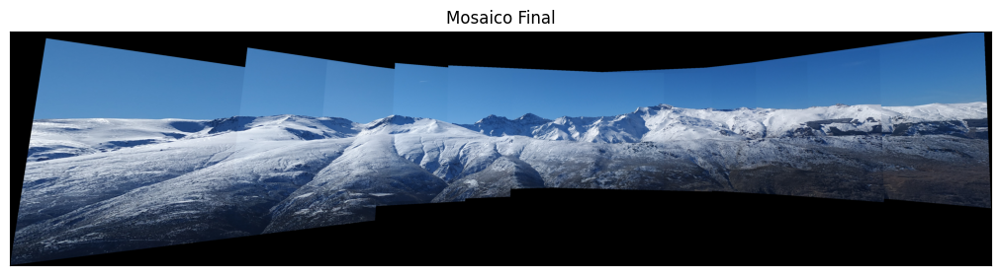

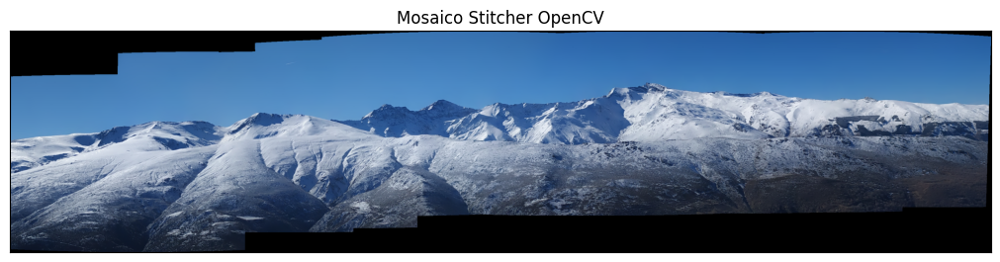

In [28]:
PREFIX = 'IMG_20220312_1029'
nameImages = ['34_S.jpg', '37_S.jpg', '40_S.jpg', '42_S.jpg', '44_S.jpg',
              '46_S.jpg', '48_S.jpg', '50_S.jpg', '51_S.jpg', '54_S.jpg', '57_S.jpg']

images = []
for item in nameImages:
   images.append(cv2.resize(readIm(get_image(PREFIX+item),flagColor=1), (0,0), fx=0.5, fy=0.5))

H_local = computeLocalHomographies(images, method='KNN', Ransac_Error=5.0)

# Índice de la imagen central
idx = len(images) // 2

# Definir tamaño del lienzo (se estima el tamaño necesario)
height, width = images[0].shape[:2]
canvas = setCanvas(height * 3, width * len(images), flagColor=True)

# Calcular homografías globales
H_global = mosaicHomographies(H_local, idx)

# Homografía para la imagen central
H0 = axesHomography(images[idx].shape, canvas.shape)

mosaic = composeMosaic(images, canvas, H_global, idx, H0)

# Eliminar bordes negros del lienzo final
mosaic_clean = blackOut(mosaic)
displayIm(mosaic_clean, "Mosaico Final", 2)

# Comparar con el mosaico generado por OpenCV Stitcher
stitcher = cv2.Stitcher_create()
status, stitched = stitcher.stitch(images)

if status == cv2.Stitcher_OK:
  displayIm(stitched, "Mosaico Stitcher OpenCV", 2)
else:
    print("Error al generar el mosaico con OpenCV Stitcher")


Vemos que la implementación propia es visualemnte menos atractiva que la de _cv2.Stitcher_. Esto puede deberse a que utilizo homografías que proyectan las imágenes sobre una superficie plana, lo que funciona bien si las fotos se toman desde el mismo punto de vista y las diferencias son de rotación o inclinación. Sin embargo, siempre hay algo de traslación al hacer las imágenes. OpenCV hace la proyección sobre una superficie cilíndrica o incluso esférica.

Además, al proyectar las imágenes y fusionarlas con _cv2.warpPerspective_ no aplico ningún método de blending, lo que resulta en transiciones abruptas entre imágenes en áreas con diferencia de brillo o color. OpenCV sí que usa técnicas de blending para suavizar transiciones entre imágenes para que se minimicen las diferencias de brillo y las áreas superpuestas de las imágenes se fusionen de manera uniforme.